# CBO Network Analysis

## Objectives

Over 31 Community Based Organizations (CBOs) were selected as part of a city program to create jobs with the opportunity for long-term professional development while supporting CDPH’s ongoing response to the COVID-19 pandemic by gathering information through interviewing and identifying potential contacts of confirmed positive cases. 

- Of these organizations which ones are maintaining their relationships after the program?
- Do the relationships look different amongst different members of the organizations?

## Notes, Questions and Assumptions

6.28.2023

Can assume no reply means 0 relation?
Yes.

The "cleaned" data files, are they only for the 2023 survey?
No, one may be mislabeled.

The 2023 version has a different wide format, can a version similar to 2021 be created?
Concetta needs to re-export.

Analysis steps:

- Need to pull rosters for orgs and determine ranks.
- Seperate networks into suprvisor vs director representatives, and third network for overall with preference on director.
    - Preference for director representation since they stay with the organizations after the project is done.
- Awareness questions to form networks. Good comparison of well known vs actually highly collaborative. 

## Imports and Utility Functions

In [5]:
import pandas as pd, numpy as np
from pandas import IndexSlice as idx
import os, re
import networkx as nx
from networkx.algorithms.community import k_clique_communities, label_propagation_communities

import matplotlib.pyplot as plt
import matplotlib as mpl

from scipy.cluster import hierarchy
from scipy.spatial import distance

import bokeh
from bokeh.io import show, output_notebook, reset_output, export_png
from bokeh.plotting import figure
from bokeh.plotting import from_networkx, output_file, save 
from bokeh.layouts import row, column, gridplot
from bokeh.models import (BoxZoomTool, Circle, HoverTool, WheelZoomTool,
                          MultiLine, Plot, Range1d, ResetTool,
                          Legend, LegendItem, Text, GraphRenderer,
                          StaticLayoutProvider, Label, LabelSet,
                          ColumnDataSource, PointDrawTool)
from bokeh.palettes import Spectral4, Category10_5

from functools import partial
from itertools import chain

# need this otherwise we might have issues accessing CDN for necessary Javascript libraries for Bokeh
os.environ['BOKEH_RESOURCES'] = 'inline'

output_notebook()

def find_dir(target):
    dir_list = []
    # rootdir = rootdir.replace('\\', '/')
    for path, subdirs, files in os.walk(os.path.expanduser("~")):
        path = path.replace('\\', '/')
        regex = re.compile(target)
        if regex.search(path):
            # return path
            # dir_list.append(path)
            return path
    # return dir_list

def find_file(target):
    dir_list = []
    for path, subdirs, files in os.walk(os.path.expanduser("~")):
        path = path.replace('\\', '/')
        for file in files:
            regex = re.compile(target)
            if regex.search(file):
                return path + '/' + file

Loading BokehJS ...

In [6]:
combined_file = find_file(r".*soc_net_surveys.*scrubbed.*.xlsx$")

In [31]:
cbo_list = [
    "Breakthrough Urban Ministries",
    "Greater West Town Community Development Project",
    "Habilitative Systems, Inc.",
    "Metropolitan Family Services (MFS)",
    "National Able Network",
    "North Lawndale Employment Network (NLEN)",
    "Puerto Rican Cultral Center",
    "Safer Foundation",
    "The Resurrection Project",
    "Westside Health Authority",
    "Back of the Yards neighborhood Council",
    "Brothers Health Collective",
    "Central States SER",
    "Envision Community Services",
    "Goodwill Industries of Metropolitan Chicago",
    "Institute for Latino Progress (Instituto)",
    "New Pisgah Community Service Organization",
    "SGA Youth and Family Services",
    "Southwest Organizing Project (SWOP)",
    "St. Sabina Employment Resource Center",
    "Ada S. McKinley Community Resources",
    "Calumet Area Industrial Commission (CAIC)",
    "Centers for New Horizons",
    "Community Assistance Programs (CAPs)",
    "KLEO Center",
    "Latino Resource Institute of Illinois",
    "Lawrence Hall",
    "Leave No Veteran Behind",
    "Phalanx Family Services",
    "South Side Help Center",
    "YWCA",
    # absent from original survey
    # "CDPH",
    "Malcolm X",
    "Chicago Cook Workforce Partnership",
    "SUHI",
    "UIC"
]

cbo_dict = {}
# cbo_dict = {cbo: "Q{}".format(cbos.index(cbo) + 5) for cbo in cbos}

num = 5
for cbo in cbo_list:
    # m = re.match(r"Q([0-9]+)", cbo_dict[cbo])
    # num = int(m.groups()[0])
    if num >= 15:
        num += 1
    if num >= 26:
        num += 1
    if num >= 39:
        num += 1
    cbo_dict[cbo] = "Q{}".format(num)
    cbo_dict["Q{}".format(num)] = cbo
    num += 1

# display(cbo_dict)

cbo_c1_raw = pd.read_excel(combined_file,
                             sheet_name="C1Text",
                             header=[2,3,4])
cbo_c2_raw = pd.read_excel(combined_file,
                             sheet_name="C2Text",
                             header=[2,3,4])

cbo_c1_raw.columns = pd.MultiIndex.from_tuples(cbo_c1_raw.columns, names=('number','name','import'))
cbo_c2_raw.columns = pd.MultiIndex.from_tuples(cbo_c2_raw.columns, names=('number','name','import'))

cbo_c1_edited = pd.read_excel(combined_file,
                             sheet_name="C1Hot",
                             header=[1,2,3])
cbo_c2_edited = pd.read_excel(combined_file,
                             sheet_name="C2Hot",
                             header=[2,3,4])

cbo_c1_edited.columns = pd.MultiIndex.from_tuples(cbo_c1_edited.columns, names=('name','number','import'))
cbo_c2_edited.columns = pd.MultiIndex.from_tuples(cbo_c2_edited.columns, names=('name','number','import'))

# print(cbo_2021_raw.columns)
# display(cbo_c1_raw.iloc[:,:20].head())
# display(cbo_c1_edited.iloc[:,:20].head())


# Transforming the Data Set

In [8]:
def relation_to_number(relation):
    if type(relation) != str:
        return 0
    relation = relation.lower()
    if "no relation" in relation:
        return 0
    elif "compete" in relation:
        return 1
    elif "coexist" in relation:
        return 2
    elif "communicate" in relation:
        return 3
    elif "cooperate" in relation:
        return 4
    elif "coordinate" in relation:
        return 5
    elif "collaborate" in relation:
        return 6
    elif "integrate" in relation:
        return 7
    
def question_num_cleaner(col: str):
    m = re.match(pattern=r"Q([0-9])$", string=col)
    if m:
        return "Q0{}".format(m.groups()[0])
    return col

def extract_int(s: str):
    m = re.match(pattern=r"Q([0-9]+)$", string=s)
    if m:
        return int(m.groups()[0])
    return None

def matches_regex(col, regex):
    m = re.match(pattern=regex, string=col, flags=re.IGNORECASE)
    if m:
        return True
    return False

def match_all_col_levels(df, match):
    matches = df.columns.map(lambda col: any([match(level) for level in col]))
    cols = df.columns[matches]
    return cols

def regex_cols(df, regex):
    cols = match_all_col_levels(df, partial(matches_regex, regex=regex))
    return cols

def correct_cbo_name(cbos, original):
    words = str(original.values).split(" ")
    # print("Before: ", words)
    if type(words) is list:
        best = 0
        best_match = original[0]
        for cbo in cbos:
            matches = 0
            for word in words[0]:
                if word in cbo:
                    matches += 1
            if matches > best:
                best = matches
                best_match = cbo
        # print("After: ", best_match)
        return str(best_match).strip()
    return str(original[0]).strip()

## Joining Review Columns with CBO Survey Data

In [9]:
def cbo_preproc_join(cbo_relations_df: pd.DataFrame, cbo_review_df: pd.DataFrame):
    cbo_review_col_tuples = cbo_review_df.columns.map(lambda col: ("Review", col[2], col[2]) if "Information" in col[0] else col)
    # display(cbo_review_col_tuples)

    cbo_review_df.columns = pd.MultiIndex.from_tuples(cbo_review_col_tuples)

    # display(cbo_review_df.columns)

    cbo_relations_df = cbo_relations_df.set_index(regex_cols(cbo_relations_df, ".*Response.Id.*")[0])
    cbo_review_df = cbo_review_df.set_index(regex_cols(cbo_review_df, ".*Response.Id.*")[0])

    cbo_combined_preproc_df = cbo_relations_df.join(cbo_review_df, how="inner")
    return cbo_combined_preproc_df, regex_cols(cbo_combined_preproc_df, ".*Review|(Response.Id).*")

cbo_c1_combined_preproc_df, review_cols = cbo_preproc_join(cbo_c1_raw.copy(), 
                                                           cbo_c1_edited[regex_cols(cbo_c1_edited, ".*Review|(Response.Id).*")].copy())
cbo_c2_combined_preproc_df, _ = cbo_preproc_join(cbo_c2_raw.copy(), 
                                                 cbo_c2_edited[regex_cols(cbo_c2_edited, ".*Review|(Response.Id).*")].copy())

## CBO Inter-Organizational Relation Information

### Correcting Question Columns

In [14]:
def correct_question_numbers(cbo_combined_preproc_df: pd.DataFrame):        
    cbo_combined_preproc_df = cbo_combined_preproc_df.rename(question_num_cleaner, axis="columns").sort_index(axis=1, ascending=[1, 0])

    # get all columns with relations except 43 and 44 which ask for future desired relationships
    # for C1Text
    # relation_cols = regex_cols(cbo_df, r"(Q[0-9]+)$")
    # for C1Num
    # relation_cols = regex_cols(cbo_df, r"(.*Select.*)$")

    relation_cols = regex_cols(cbo_combined_preproc_df, r"(Q(?!4[34])[0-9]+)$")
    
    return cbo_combined_preproc_df, relation_cols
    
cbo_c1_combined_preproc_df, relation_cols = correct_question_numbers(cbo_c1_combined_preproc_df)
cbo_c2_combined_preproc_df, _ = correct_question_numbers(cbo_c2_combined_preproc_df)

### Correcting CBO Names

In [30]:
def correct_cbo_names(cbo_combined_preproc_df: pd.DataFrame):
    org_col = cbo_combined_preproc_df.columns[cbo_combined_preproc_df.columns.map(lambda x: "Organization Represented" in x[1])]

    cbo_df = pd.DataFrame(columns=relation_cols).transpose()
    cbo_df = cbo_df.index.to_frame()
    cbo_df = cbo_df.drop(columns=["number", "import"])
    cbo_df.index = pd.Index(cbo_df.index.droplevel(["number","import"]), name="Organization")

    # fix org name inconsistencies
    cbo_combined_preproc_df.loc[:,org_col] = cbo_combined_preproc_df.loc[:,org_col].apply(lambda row: correct_cbo_name(cbo_df['name'].values, row), axis=1)
    return cbo_combined_preproc_df, cbo_df, org_col

cbo_c1_combined_preproc_df, cbo_df, org_col = correct_cbo_names(cbo_c1_combined_preproc_df)
cbo_c2_combined_preproc_df, _, _ = correct_cbo_names(cbo_c2_combined_preproc_df)
# display(cbo_c2_combined_preproc_df.loc[:,org_col].value_counts())

## Filtering and Prepping DataFrame for Networkx

A couple judgements and rules were made to streamline the processing and interpretation of the inter-organizational survey data:

- A prior prioritization ranking was manually determined based on organizational hierarchy. Levels of priority will then be split into separate networks to show different perspectives of inter-organizational relations.
- 

In [16]:
cbo_df.reset_index(inplace=False).drop(columns="name")

,Organization
0,Breakthrough Urban Ministries
1,Greater West Town Community Development Project
2,"Habilitative Systems, Inc."
3,Metropolitan Family Services (MFS)
4,National Able Network
5,North Lawndale Employment Network (NLEN)
6,Puerto Rican Cultural Center
7,Safer Foundation
8,The Resurrection Project
9,Westside Health Authority


In [17]:
def create_adj(cbo_combined_df, cbo_df, org_col, review_cols, relation_cols, is_priority):
    cbo_combined_df.loc[:,relation_cols] = cbo_combined_df.loc[:,relation_cols].applymap(lambda row: relation_to_number(row))

    cbo_review_relations = pd.concat([cbo_combined_df.loc[:, org_col],
                                    cbo_combined_df[regex_cols(cbo_combined_df, ".*Information.*Name")],
                                    # cbo_combined_df.loc[:, review_cols],
                                    cbo_combined_df[regex_cols(cbo_combined_df, ".*Review.*")],
                                    cbo_combined_df.loc[:, relation_cols]],
                                    axis=1)

    cbo_groups = cbo_review_relations.groupby(regex_cols(cbo_review_relations, ".*Organization Rep.*")[0])
    cbo_subselection = cbo_groups.apply(lambda df: is_priority(df))

    cbo_list = list(chain(*cbo_subselection[org_col].applymap(lambda x: x.strip()).values))
    cbo_subselection.index = pd.Index(cbo_list, name="Organization")
    cbo_df = cbo_df.drop(columns="name")
    cbo_df = pd.DataFrame(cbo_df, columns=cbo_subselection[relation_cols].columns)

    # join the list of all cbos with participating cbo list to make adjacency matrix
    cbo_adj = cbo_df.fillna(cbo_subselection[relation_cols], axis=1)

    # multiindex joins will be deprecated in the future, cbo_selection still has multiindex column
    # cbo_adj = cbo_df.join(cbo_subselection[relation_cols], how="left")
    
    # eliminate self-references
    for i in range(cbo_adj.shape[0]):
        cbo_adj.iloc[i, i] = 0

    # the rest of the matrix will be assumed to be non-relationships
    cbo_adj = cbo_adj.fillna(0, axis=1).astype(int)

    # simplifying column index
    cbo_adj.columns = cbo_adj.columns.map(lambda x: x[1])
    
    return cbo_adj

### Creating Network of Primaries

In [29]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 

cbo_c1_combined_df = cbo_c1_combined_preproc_df.copy()
cbo_c2_combined_df = cbo_c2_combined_preproc_df.copy()

def is_primary(df: pd.DataFrame):
    # applying prioritization rules to deduplicate rows
    decision_col = regex_cols(df, "Decision")
    df = df[(df[decision_col] == "Primary").values]
    is_complete = df[regex_cols(df, ".*Justification.*")[0]].apply(lambda row: "more complete" in str(row))
    if any(is_complete):
        df = df[is_complete]
    return df
    
cbo_c1_primary_adj = create_adj(cbo_c1_combined_df, cbo_df, org_col, review_cols, relation_cols, is_primary)
cbo_c2_primary_adj = create_adj(cbo_c2_combined_df, cbo_df, org_col, review_cols, relation_cols, is_primary)

# sanity check
if cbo_c1_primary_adj.sum().sum() == 0:
    raise Exception()
if cbo_c2_primary_adj.sum().sum() == 0:
    raise Exception()

# cbo_c2_primary_adj

## Creating Network of Secondaries

In [34]:
def is_secondary(df: pd.DataFrame):
    # applying prioritization rules to deduplicate rows
    decision_col = regex_cols(df, "Decision")
    df = df[(df[decision_col] == "Secondary").values]
    is_complete = df[regex_cols(df, ".*Justification.*")[0]].apply(lambda row: "more complete" in str(row))
    if any(is_complete):
        df = df[is_complete]
    # display(df)
    return df

cbo_c1_secondary_adj = create_adj(cbo_c1_combined_df, cbo_df, org_col, review_cols, relation_cols, is_secondary)
cbo_c2_secondary_adj = create_adj(cbo_c2_combined_df, cbo_df, org_col, review_cols, relation_cols, is_secondary)

# display(cbo_secondary_adj)

# sanity check
if cbo_c1_secondary_adj.sum().sum() == 0:
    print("Adjacency C1 matrix has no nonzero values!")
if cbo_c2_secondary_adj.sum().sum() == 0:
    print("Adjacency C2 matrix has no nonzero values!")

Adjacency C1 matrix has no nonzero values!
Adjacency C2 matrix has no nonzero values!


Neither of the matrics have nonzero values so it does not appear helpful to look at relationships from secondary ranked members of the organizations.

# Drawing the Networks

## Year by Year Networks

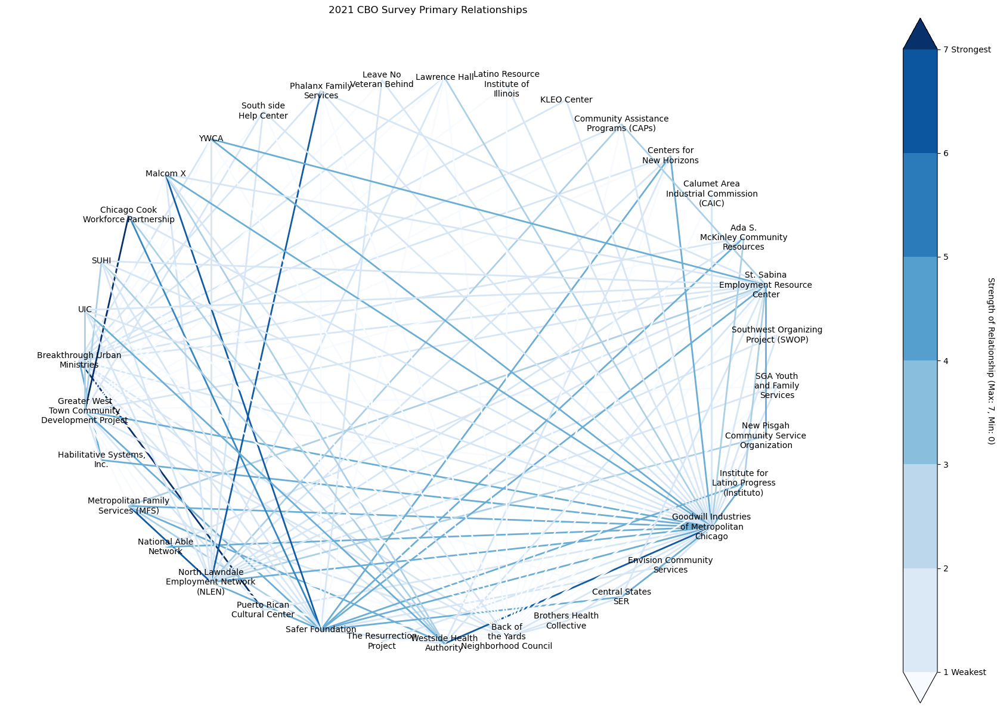

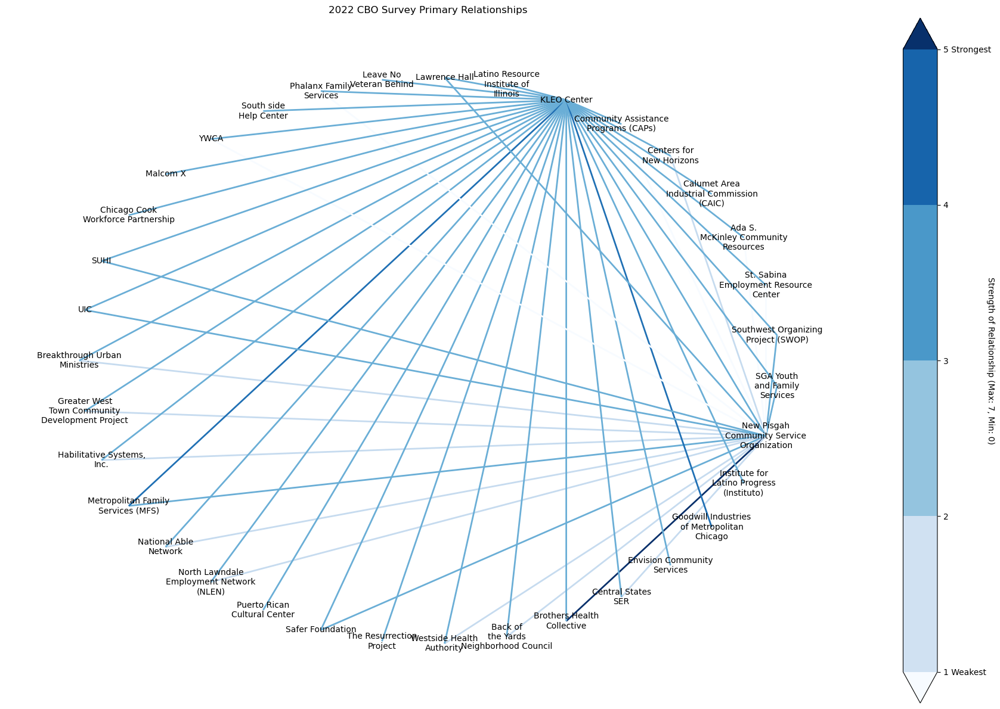

In [25]:
import matplotlib.pyplot as plt
import matplotlib as mpl

def draw_cbo_network(cbo_adj, cmap=plt.cm.Blues, title="", cbar_label="Strength of Relationship (Max: 7, Min: 0)", highest="Strongest", lowest="Weakest"):
    cbo_graph = nx.from_pandas_adjacency(df=cbo_adj)

    fig, ax = plt.subplots(figsize=(18, 12))

    options = {
        # "node_color": "#A0CBE2",
        "edge_color": range(20),
        # "width": 4,
        "edge_cmap": plt.cm.Blues,
        # "with_labels": False,
    }

    M = cbo_graph.number_of_edges()
    edge_colors = [edgedata["weight"] for _, _, edgedata in cbo_graph.edges(data=True)]

    edges = nx.draw_networkx_edges(
        cbo_graph,
        pos=nx.shell_layout(cbo_graph),
        # pos=nx.spring_layout(cbo_graph, seed=8),
        edge_color=edge_colors,
        edge_cmap=cmap,
        width=2
    )

    new_labels = {}
    for node in cbo_graph.nodes:
        words = node.split(" ")
        new_split = [" ".join(words[i:i+2]) for i in range(0, len(words), 2)]
        new_label = "\n".join(new_split)
        new_labels[node] = new_label
    # nx.relabel_nodes(cbo_graph, new_labels)

    nx.draw_networkx_labels(cbo_graph, nx.shell_layout(cbo_graph), new_labels, font_size=10)

    vmin = min(edge_colors)
    vmax = max(edge_colors)
    
    # display(vmin, vmax)
    
    # color_norm = plt.Normalize(vmin=vmin, vmax=vmax)
    bounds = [i for i in range(vmin, vmax+1, 1)]
    color_norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')
    # if cmap != plt.cm.Blues: 
    double_bounded = False
    if vmin < 0 and vmax > 0:
        double_bounded = True

    if double_bounded:
        # need to reset white to 0
        # d = np.random.normal(.4, 2, (10,10))
        # color_norm = mpl.colors.TwoSlopeNorm(vmin = d.min(), vmax = d.max(), vcenter = 0)
        if np.absolute(vmin) != np.absolute(vmax):
            abs_max = np.maximum(np.absolute(vmin), np.absolute(vmax))
            # print(abs_max)
            bounds = [i for i in range(-abs_max, abs_max+1, 1)]
            # display(bounds)
            color_norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')
        
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=color_norm)
    sm.set_array([])

    ax.set_title(title)
    ax.set_axis_off()
    fig.tight_layout()

    cbar = plt.colorbar(sm, ax=ax)
    tick_labels = cbar.ax.get_yticklabels()
    # display(tick_labels)
    new_tick_labels = []
    # for text in tick_labels:
    for t in bounds:
        # display(text)
        # x = text.get_unitless_position()[0]
        # y = text.get_unitless_position()[1]
        # t = text.get_text()
        new_text = None
        if t == vmin:
            new_text = mpl.text.Text(1, t, "{} {}".format(t, lowest))
        elif t == vmax:
            new_text = mpl.text.Text(1, t, "{} {}".format(t, highest))
        else:
            # new_tick_labels.append(text)
            new_text = mpl.text.Text(1, t, t)
        new_tick_labels.append(new_text)
    # display(new_tick_labels)
    cbar.ax.set_yticklabels(new_tick_labels)
    cbar.ax.set_ylabel(cbar_label, rotation=270)
    
    plt.show()

draw_cbo_network(cbo_c1_primary_adj, title="2021 CBO Survey Primary Relationships")
draw_cbo_network(cbo_c2_primary_adj, title="2022 CBO Survey Primary Relationships")

## Comparing the Two Years

In [23]:
dimension_equality = cbo_c2_primary_adj.columns == cbo_c1_primary_adj.columns 

changes = cbo_c2_primary_adj - cbo_c1_primary_adj

# display(changes)

valid_changes = changes*((cbo_c2_primary_adj != 0)*((cbo_c1_primary_adj != 0)))

transpose_valid_changes = changes*((cbo_c2_primary_adj.T != 0)*((cbo_c1_primary_adj != 0)))


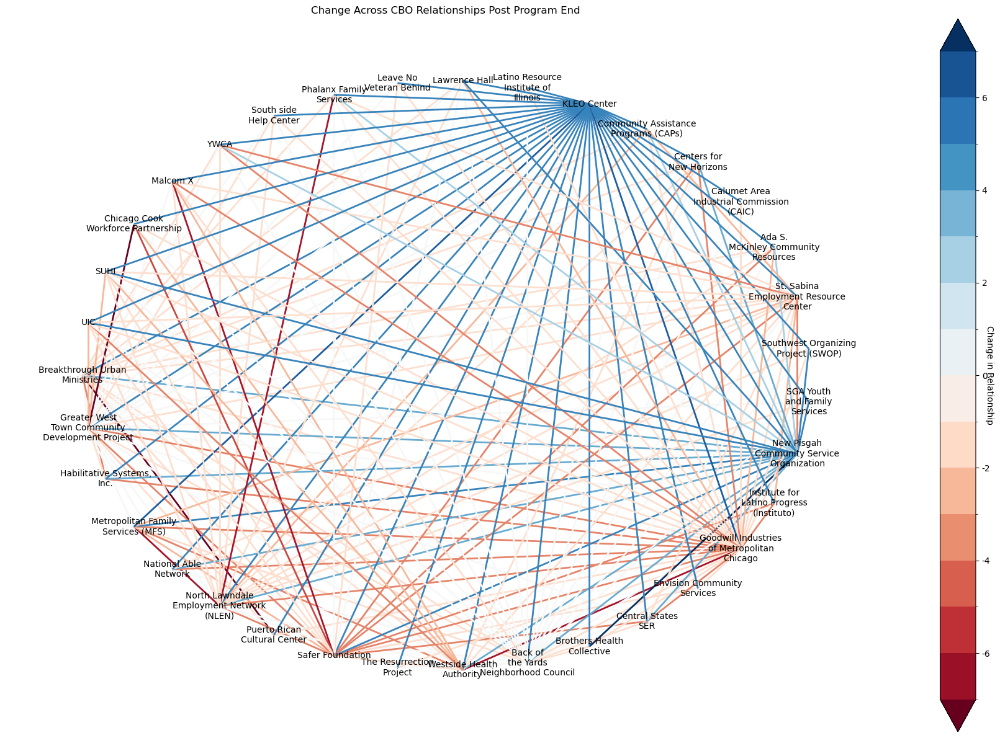

In [27]:
draw_cbo_network(
    cbo_adj=changes, 
    cmap=plt.cm.RdBu, 
    title="Change Across CBO Relationships Post Program End", 
    cbar_label="Change in Relationship", 
    highest="Improvement", 
    lowest="Deterioration"
)

Are there any changes in survey responses from organizations across both years?

In [ ]:
any((valid_changes != 0).apply(any)) or any((transpose_valid_changes != 0).apply(any)) 

True

Which organizations filled out the survey for both years?

In [ ]:
consistent_responses = (transpose_valid_changes != 0).apply(any)

remaining_cbos = consistent_responses[consistent_responses].index.to_frame(index=False)

remaining_cbos

,0
0,New Pisgah Community Service Organization
1,KLEO Center


Of the organizations that took both surveys (i.e. both years) what relationship changes were there if any, do any organizations maintain their relationships? An empty graph would mean that were not relationship changes.

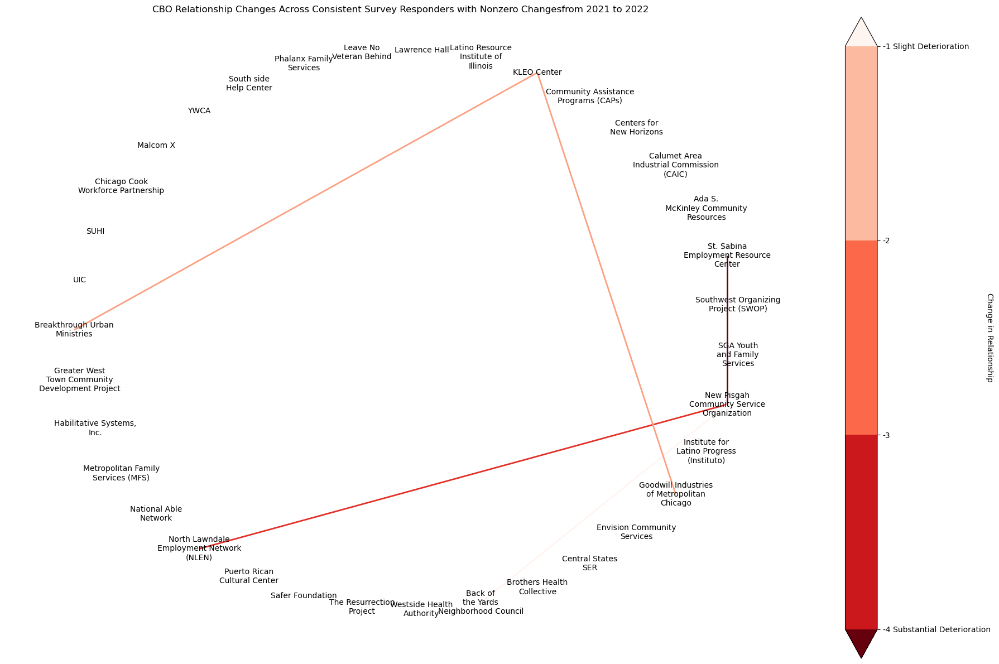

In [26]:
draw_cbo_network(transpose_valid_changes, 
    cmap=plt.cm.Reds_r, 
    title="CBO Relationship Changes Across Consistent Survey Responders with Nonzero Changesfrom 2021 to 2022", 
    cbar_label="Change in Relationship", 
    highest="Slight Deterioration", 
    lowest="Substantial Deterioration"
)

# Interactive CBO Networks

In [ ]:
cbo_graph = nx.from_numpy_matrix(cbo_c1_primary_adj.to_numpy())

cbo_bokeh = from_networkx(
    cbo_graph, 
    nx.spring_layout, 
    # k=1/(names_2021['Label'].nunique())**(1/5),
    seed=8, 
    scale=1, 
    center=(0, 0)
)

cbo_bokeh.node_renderer.glyph = Circle(size=10, fill_color='node_color')
cbo_bokeh.edge_renderer.glyph = MultiLine(line_alpha=0.5, line_width=0.5)

def legend_from_nodes(df: pd.DataFrame, b: bokeh.models.GraphRenderer):
    col = 'affiliation'
    if col not in df.columns:
        col = 'university'
    legend_index = df.groupby(col, group_keys=False)
    display(legend_index.apply(lambda x: x.head(1)))
    # get first item from groups
    legend_index = legend_index.apply(lambda x: x.head(1)).to_dict()[col]
    print("Legend Node Reference: ")
    print(legend_index)
    return Legend(items=[
        LegendItem(label=legend_index[row],
                renderers=[b.node_renderer],
                index=row) for row in legend_index
    ])

cbo_nodes = pd.DataFrame(cbo_bokeh.node_renderer.data_source.data)

plot_2021 = figure(width=600, height=600)
# plot_2021.title.text = "Network ({:,} Connections)".format(cbo_graph.number_of_edges())
plot_2021.title.text_font_size = "24px"
plot_2021.axis.visible = False
plot_2021.renderers.append(cbo_bokeh)
# plot_2021.add_layout(legend_from_nodes(cbo_nodes, cbo_bokeh))
plot_2021.add_tools(PointDrawTool(renderers = [cbo_bokeh.node_renderer], empty_value = 'black'))

reset_output()
output_notebook()

show(plot_2021)

Loading BokehJS ...

## Cytoscape Networks

### Generating Cytoscape Data

In [ ]:
from dash import Dash, html
import dash_cytoscape as cyto
import json

cbo_graph = nx.from_numpy_matrix(cbo_c1_primary_adj.to_numpy())

cbo_idx = cbo_df.reset_index(inplace=False).drop(columns="name")

pos = nx.shell_layout(cbo_graph)

cbo_idx = cbo_df.reset_index(inplace=False).drop(columns="name")

cbo_cy = nx.cytoscape_data(cbo_graph)

new_nodes = []
for node in cbo_cy['elements']['nodes']:
    # print(node)
    # print(node['data'])
    id = int(node['data']['id'])
    node['data']['label'] = cbo_idx.iloc[id].values[0]
    new_node = {
        'data': node['data'], 
        'position': {
            'x': pos[id][0], 
            'y': pos[id][1]
        },
        'classes': 'multiline-auto'
    }
    new_nodes.append(new_node)

new_json = new_nodes + cbo_cy['elements']['edges']

# Save the JSON object to a file
with open("cbo_cytoscape/cbo_cytoscape.json", "w") as json_file:
    json.dump(new_json, json_file, indent=4)